# EDA - Exploratory Data Analysis
Version: 3.00 - April 12, 2020
Comments have not been updated since April 3, 2020

In [1]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)


### Load Data 

In [2]:
for dirname, _, filenames in os.walk('./COVID19/'):
    filenames.sort()
    for filename in filenames:
        os.path.join(dirname, filename)

In [3]:
#time
datadir = Path('./COVID19/week 4/')

# Read in the data CSV files
train = pd.read_csv(datadir/'train.csv')
test = pd.read_csv(datadir/'test.csv')
submission = pd.read_csv(datadir/'submission.csv')

In [4]:
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
test.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')
test['country_province'] = test['country'].fillna('') + '/' + test['province'].fillna('')

## Worldwide Trend

In [5]:
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()
ww_df['new_case'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)

ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])
ww_melt_df

In [6]:
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])

### Watch this exponential growth. It seems to be doubling each week.

In [7]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide Confirmed/Death Cases Over Time")
fig.show()

#### the number almost doubled in last 1 week... 
#### Confirmed cases reached 593K people, and 27K people already died on March 27. 
#### Confirmed cases reached 1M people, and 52K people already died on April 2. 
#### Good news! Daily new confirmed cases start to decrease from April 4, I hope this trend will continue..

In [8]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide Confirmed/Death Cases Over Time (Log scale)",
             log_y=True)
fig.show()

#### The fatalities curve seems to just be a shift of the curve for confirmed cases, meaning that mortality rate is almost constant. Watch as the mortality rate rises from 3% to 5% as of April 3rd, 2020. Europe and the US has been hit hard.

In [9]:
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide Mortality Rate Over Time")
fig.show()

## Country-wide Growth

In [12]:
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities']].sum().reset_index()

In [15]:
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in the dataset')

184 countries are in the dataset


In [16]:
target_date = country_df['date'].max()

print('Date: ', target_date)
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed cases')

Date:  2020-04-11
184 countries have more than 1 confirmed cases
167 countries have more than 10 confirmed cases
122 countries have more than 100 confirmed cases
68 countries have more than 1000 confirmed cases
20 countries have more than 10000 confirmed cases


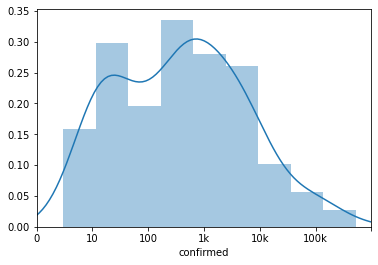

In [17]:
ax = sns.distplot(np.log10(country_df.query('date == "2020-04-11"')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

In [22]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 10000)').sort_values('confirmed', ascending=False)
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])

#### It seems that US, Italy, and Spain top the list with even Germany having more confirmed cases than China. Korea is also high relative to its population. I believe this is because Korea executes inspection aggressively.

In [23]:
fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Confirmed Cases/Deaths on {target_date}', text='value', height=700, orientation='h')
fig.show()

#### Let's check major country's growth by date. 

In [34]:
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed Cases for top 30 country as of {target_date}')
fig.show()

#### We can see coronavirus hit China first, but its trend has gone down and flattened by March. Europe is hit by the second wave in March (Italy, Spain, Germany, France, UK). The third wave hits the US now, and the US has a higher growth rate than China or Europe. Its main spread starts from the ides of March and its speed is greater than that of Italy. 

In [37]:
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'Fatalities for top 30 country as of {target_date}')
fig.show()

### We see that in terms of fatalities, Europe is more serious than the US right now
#### Let's look at mortality rate by country

In [38]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)


In [39]:
fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality rate HIGH: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

#### Italy's mortality rate is at 12% as of 4/3/2020. Overall, the top 30 countries have at least a 3-12x higher rate of mortality than what we are lead to believe (the 0.01% number for major demographics). 
##### Maybe we can look at countries whose mortality rates are low for insight. THough, many of these countries simply do not report/measure fatalities properly.

In [41]:
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

#### We can see Italy, and Europe is pretty high. Same for the US and China. However, I wonder why the Phillipines and Indonesia are high while Malaysia, Thailand, Vietnam, and Australia are low - they're all tropical countries. 

In [42]:
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']

In [43]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="peach", 
                    title='Countries with Confirmed Cases')

# I'd like to update colorbar to show raw values, but this does not work somehow...
# Please let me know if you know how to do this!!
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

In [44]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="peach", 
                    title='Countries with fatalities')
fig.show()

In [45]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="peach", 
                    title='Countries with mortality rate')
fig.show()

#### If we look at only "New" cases, we find the following trends:
#### China reached its peak in Feb 14, new confirmed cases for China is relatively low
#### Europe and US spread starts mid-March, after China slows down
#### Lock Down Policy in Europe (Italy, Spain, Germany, France) should now come into effect, seems that the number of new confirmed cases in Europe is not as high now as it was in mid-March
#### USA has the highes speed of new confirmed cases

In [46]:
n_countries = 20
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

In [47]:
fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'Fatalities by country since 10 deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 21], y=[0, 3], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 42], y=[0, 3], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 63], y=[0, 3], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

#### China has finished its peak at Feb 14, new confirmed cases are surpressed now.
#### Europe  and US spread starts on mid of March, after China slows down.
#### I feel effect of lock down policy in Europe (Italy, Spain, Germany, France) now comes on the figure, the number of new cases are not so increasing rapidly at the end of March.
#### Current US new confirmed cases are the worst speed, recording worst speed at more than 30k people/day at peak. 
#### Daily new confirmed cases start to decrease from April 4, I hope this trend will continue..

In [48]:
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

In [49]:
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed cases spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()


In [50]:
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Fatalities growth Over Time', color_continuous_scale="portland")
fig.show()

In [51]:
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Daily NEW cases over Time', color_continuous_scale="portland")
fig.show()

## Provinces 
##### Only 8 countries have province data

In [52]:
for country in countries:
    province = train.query('country == @country')['province'].unique()
    if len(province) > 1:       
        print(f'Country {country} has {len(province)} provinces')

Country Australia has 8 provinces
Country Canada has 12 provinces
Country China has 33 provinces
Country Denmark has 3 provinces
Country France has 11 provinces
Country Netherlands has 5 provinces
Country US has 54 provinces
Country United Kingdom has 11 provinces


## USA

In [53]:
usa_state_code_df = pd.read_csv('./usa_states2.csv')# Prepare data frame only for US. 

train_us = train.query('country == "US"')
train_us['mortality_rate'] = train_us['fatalities'] / train_us['confirmed']

# Convert province column to its 2-char code name,
state_name_to_code = dict(zip(usa_state_code_df['state_name'], usa_state_code_df['state_code']))
train_us['province_code'] = train_us['province'].map(state_name_to_code)

# Only show latest days.
train_us_latest = train_us.query('date == @target_date')

In [54]:
# Prepare data frame only for US. 

train_us = train.query('country == "US"')
train_us['mortality_rate'] = train_us['fatalities'] / train_us['confirmed']

# Convert province column to its 2-char code name,
state_name_to_code = dict(zip(usa_state_code_df['state_name'], usa_state_code_df['state_code']))
train_us['province_code'] = train_us['province'].map(state_name_to_code)

# Only show latest days.
train_us_latest = train_us.query('date == @target_date')

In [55]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='confirmed', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Confirmed cases in US on {target_date}')
fig.show()

In [56]:
train_us_latest.sort_values('confirmed', ascending=False)
{
    "tags": [
        "hide_input",
    ]
}

{'tags': ['hide_input']}

In [57]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='mortality_rate', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Mortality rate in US on {target_date}')
fig.show()

In [58]:
train_us_march = train_us.query('date > "2020-03-01"')
fig = px.line(train_us_march,
              x='date', y='confirmed', color='province',
              title=f'Confirmed cases by state in US, as of {target_date}')
fig.show()

## Europe

In [59]:
# Ref: https://www.kaggle.com/abhinand05/covid-19-digging-a-bit-deeper
europe_country_list =list([
    'Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland',
    'Italy', 'Latvia','Luxembourg','Lithuania','Malta','Norway','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia',
    'Spain', 'Sweden', 'United Kingdom', 'Iceland', 'Russia', 'Switzerland', 'Serbia', 'Ukraine', 'Belarus',
    'Albania', 'Bosnia and Herzegovina', 'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia'])

country_df['date'] = pd.to_datetime(country_df['date'])
train_europe = country_df[country_df['country'].isin(europe_country_list)]
#train_europe['date_str'] = pd.to_datetime(train_europe['date'])
train_europe_latest = train_europe.query('date == @target_date')

In [60]:
fig = px.choropleth(train_europe_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, train_europe_latest['confirmed'].max()], 
                    color_continuous_scale='portland', 
                    title=f'European Countries with Confirmed Cases as of {target_date}', scope='europe', height=800)
fig.show()

In [61]:
train_europe_march = train_europe.query('date >= "2020-03-01"')
fig = px.line(train_europe_march,
              x='date', y='confirmed', color='country',
              title=f'Confirmed cases by country in Europe, as of {target_date}')
fig.show()

In [62]:
fig = px.line(train_europe_march,
              x='date', y='fatalities', color='country',
              title=f'Fatalities by country in Europe, as of {target_date}')
fig.show()

In [63]:
train_europe_march['prev_confirmed'] = train_europe_march.groupby('country')['confirmed'].shift(1)
train_europe_march['new_case'] = train_europe_march['confirmed'] - train_europe_march['prev_confirmed']
fig = px.line(train_europe_march,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country in Europe')
fig.show()

## Asia

In [64]:
country_latest = country_df.query('date == @target_date')

fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, 50000], 
                    color_continuous_scale='portland', 
                    title=f'Asian Countries with Confirmed Cases as of {target_date}', scope='asia', height=800)
fig.show()

In [65]:
top_asian_country_df = country_df[country_df['country'].isin(['China', 'Indonesia', 'Iran', 'Japan', 'Korea, South', 'Malaysia', 'Philippines'])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

## Recovery

In [66]:
max_confirmed = country_df.groupby('country')['new_case'].max().reset_index()
country_latest = pd.merge(country_latest, max_confirmed.rename({'new_case': 'max_new_case'}, axis=1))
country_latest['new_case_peak_to_now_ratio'] = country_latest['new_case'] / country_latest['max_new_case']

In [67]:
recovering_country = country_latest.query('new_case_peak_to_now_ratio < 0.5')
major_recovering_country = recovering_country.query('confirmed > 100')

In [68]:
fig = px.bar(major_recovering_country.sort_values('new_case_peak_to_now_ratio', ascending=False),
             x='new_case_peak_to_now_ratio', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='new_case_peak_to_now_ratio', height=1000, orientation='h')
fig.show()

In [69]:
fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="new_case_peak_to_now_ratio", 
                    hover_name="country", range_color=[0, 1], 
                    # color_continuous_scale="peach", 
                    hover_data=['confirmed', 'fatalities', 'new_case', 'max_new_case'],
                    title='Countries with new_case_peak_to_now_ratio')
fig.show()

In [70]:
china_df = train.query('country == "China"')
china_df['prev_confirmed'] = china_df.groupby('country')['confirmed'].shift(1)
china_df['new_case'] = china_df['confirmed'] - china_df['prev_confirmed']
china_df.loc[china_df['new_case'] < 0, 'new_case'] = 0.

In [71]:
fig = px.line(china_df,
              x='date', y='new_case', color='province',
              title=f'DAILY NEW Confirmed cases in China by province')
fig.show()

In [72]:
china_df.query('(province == "Hubei") & (date > "2020-03-10")')


,id,province,country,date,confirmed,fatalities,country_province,prev_confirmed,new_case
5476,7688,Hubei,China,2020-03-11,67773.0,3046.0,China/Hubei,67760.0,13.0
5477,7689,Hubei,China,2020-03-12,67781.0,3056.0,China/Hubei,67773.0,8.0
5478,7690,Hubei,China,2020-03-13,67786.0,3062.0,China/Hubei,67781.0,5.0
5479,7691,Hubei,China,2020-03-14,67790.0,3075.0,China/Hubei,67786.0,4.0
5480,7692,Hubei,China,2020-03-15,67794.0,3085.0,China/Hubei,67790.0,4.0
5481,7693,Hubei,China,2020-03-16,67798.0,3099.0,China/Hubei,67794.0,4.0
5482,7694,Hubei,China,2020-03-17,67799.0,3111.0,China/Hubei,67798.0,1.0
5483,7695,Hubei,China,2020-03-18,67800.0,3122.0,China/Hubei,67799.0,1.0
5484,7696,Hubei,China,2020-03-19,67800.0,3130.0,China/Hubei,67800.0,0.0
5485,7697,Hubei,China,2020-03-20,67800.0,3133.0,China/Hubei,67800.0,0.0


## Sigmoid Fitting - When will it converge?

In [73]:
def sigmoid(t, M, beta, alpha, offset=0):
    alpha += offset
    return M / (1 + np.exp(-beta * (t - alpha)))

def error(x, y, params):
    M, beta, alpha = params
    y_pred = sigmoid(x, M, beta, alpha)
    loss_mse = np.mean((y_pred - y) ** 2)
    return loss_mse

def gen_random_color(min_value=0, max_value=256) -> str:
    """Generate random color for plotly"""
    r, g, b = np.random.randint(min_value, max_value, 3)
    return f'rgb({r},{g},{b})'

In [74]:
def fit_sigmoid(exclude_days=0):
    target_country_df_list = []
    pred_df_list = []
    for target_country in top30_countries:
        print('target_country', target_country)
        # --- Train ---
        target_country_df = country_df.query('country == @target_country')

        #train_start_date = target_country_df['date'].min()
        train_start_date = target_country_df.query('confirmed > 1000')['date'].min()
        train_end_date = pd.to_datetime(target_date) - pd.Timedelta(f'{exclude_days} days')
        target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')
        if len(target_date_df) <= 7:
            print('WARNING: the data is not enough, use 7 more days...')
            train_start_date -= pd.Timedelta('7 days')
            target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')

        confirmed = target_date_df['confirmed'].values
        x = np.arange(len(confirmed))

        lossfun = lambda params: error(x, confirmed, params)
        res = sp.optimize.minimize(lossfun, x0=[np.max(confirmed) * 5, 0.08, len(confirmed) / 3.], method='nelder-mead')
        M, beta, alpha = res.x
        # sigmoid_models[key] = (M, beta, alpha)
        # np.clip(sigmoid(list(range(len(data), len(data) + steps)), M, beta, alpha), 0, None).astype(int)

        # --- Pred ---
        pred_start_date = target_country_df['date'].min()
        pred_end_date = pd.to_datetime('2020-07-01')
        days = int((pred_end_date - pred_start_date) / pd.Timedelta('1 days'))
        # print('pred start', pred_start_date, 'end', pred_end_date, 'days', days)

        x = np.arange(days)
        offset = (train_start_date - pred_start_date) / pd.Timedelta('1 days')
        print('train_start_date', train_start_date, 'offset', offset, 'params', M, beta, alpha)
        y_pred = sigmoid(x, M, beta, alpha, offset=offset)
        # target_country_df['confirmed_pred'] = y_pred

        all_dates = [pred_start_date + np.timedelta64(x, 'D') for x in range(days)]
        pred_df = pd.DataFrame({
            'date': all_dates,
            'country': target_country,
            'confirmed_pred': y_pred,
        })

        target_country_df_list.append(target_country_df)
        pred_df_list.append(pred_df)
    return target_country_df_list, pred_df_list

In [75]:
def plot_sigmoid_fitting(target_country_df_list, pred_df_list, title=''):
    n_countries = len(top30_countries)

    # --- Plot ---
    fig = go.Figure()

    for i in range(n_countries):
        target_country = top30_countries[i]
        target_country_df = target_country_df_list[i]
        pred_df = pred_df_list[i]
        color = gen_random_color(min_value=20)
        # Prediction
        fig.add_trace(go.Scatter(
            x=pred_df['date'], y=pred_df['confirmed_pred'],
            name=f'{target_country}_pred',
            line=dict(color=color, dash='dash')
        ))

        # Ground truth
        fig.add_trace(go.Scatter(
            x=target_country_df['date'], y=target_country_df['confirmed'],
            mode='markers', name=f'{target_country}_actual',
            line=dict(color=color),
        ))
    fig.update_layout(
        title=title, xaxis_title='Date', yaxis_title='Confirmed cases')
    fig.show()

In [82]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=0)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 657015.6790332706 0.20382672193930348 24.658091808975826
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 158430.2590210493 0.15448609594761578 25.976132061209668
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 173642.32217462832 0.19733027845520587 20.89661262323048
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 189124.30851937324 0.1638650278483556 28.641728593685748
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 118399.44421531817 0.1775433360464619 24.273942028693938
target_country Iran
train_start_date 2020-03-02 00:00:00 offset 40.0 params 97725.64042275422 0.10870672389075806 30.871984486240894
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 33261.71871578845 0.18321130486588336 17.803438631144335
target_country China
train_start_date 2020-01-25 00:00

In [83]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting with all latest data')

### The results I get show me that the number of confirmed cases will slow down and converge in mid-April for most of the USA. 
#### Iran, belgium< Sweden, and Denmark will converge later - around May
#### Let's validate the accuracy by checking what it would have predicted last week by excluding data for the past 7 days

In [84]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=7)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 479769.0475019108 0.23988747797867918 21.741296668500745
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 139903.71499024713 0.174425239757677 24.105802666461074
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 157279.43278237246 0.21546236883815423 19.749892351489464
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 408670.7701924284 0.13808386256223276 36.99995574811729
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 83670.26850573567 0.2038854699075811 20.832704202743102
target_country Iran
train_start_date 2020-03-02 00:00:00 offset 40.0 params 145976.83985161313 0.09576907575435012 37.83008806463322
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 25573.489602379912 0.219130150290169 14.929937931232741
target_country China
train_start_date 2020-01-25 00:00:00

In [85]:
d = plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting without last 7days data')

### It seems as though sigmoid fitting tends to UNDERESTIMATE the curve, and its actual value tends to be more than the sigmoid curve fit estimation. 